In [1]:
import numpy as np
import pandas as pd
import os

In [2]:
train_df = pd.read_csv("/kaggle/input/rsna-2023-abdominal-trauma-detection/train_2024.csv")
image_level_df = pd.read_csv("/kaggle/input/rsna-2023-abdominal-trauma-detection/image_level_labels_2024.csv")

train_df.head()

,patient_id,bowel_healthy,bowel_injury,extravasation_healthy,extravasation_injury,kidney_healthy,kidney_low,kidney_high,liver_healthy,liver_low,liver_high,spleen_healthy,spleen_low,spleen_high,any_injury
0,10004,1,0,0,1,0,1,0,1,0,0,0,0,1,1
1,10005,1,0,1,0,1,0,0,1,0,0,1,0,0,0
2,10007,1,0,1,0,1,0,0,1,0,0,1,0,0,0
3,10026,1,0,1,0,1,0,0,1,0,0,1,0,0,0
4,10051,1,0,1,0,1,0,0,1,0,0,0,1,0,1


In [3]:
image_level_df.head()

,patient_id,series_id,instance_number,injury_name
0,10004,21057,362,Active_Extravasation
1,10004,21057,363,Active_Extravasation
2,10004,21057,364,Active_Extravasation
3,10004,21057,365,Active_Extravasation
4,10004,21057,366,Active_Extravasation


# CSV Preprocessing

In [4]:
series_meta_df = pd.read_csv("/kaggle/input/rsna-2023-abdominal-trauma-detection/train_series_meta.csv")
series_meta_df.head()

,patient_id,series_id,aortic_hu,incomplete_organ
0,10004,21057,146.00,0
1,10004,51033,454.75,0
2,10005,18667,187.00,0
3,10007,47578,329.00,0
4,10026,29700,327.00,0


In [5]:
def preprocess_data():
    """CSV preprocessing function - keeping the exact same code we verified works"""
    try:
        # Load data with corrected column names
        train_df = pd.read_csv("/kaggle/input/rsna-2023-abdominal-trauma-detection/train_2024.csv")
        train_df.columns = [
            'patient_id', 'bowel_healthy', 'bowel_injury', 'extravasation_healthy',
            'extravasation_injury', 'kidney_healthy', 'kidney_low', 'kidney_high',
            'liver_healthy', 'liver_low', 'liver_high', 'spleen_healthy',
            'spleen_low', 'spleen_high', 'any_injury'
        ]

        image_labels_df = pd.read_csv("/kaggle/input/rsna-2023-abdominal-trauma-detection/image_level_labels_2024.csv")
        image_labels_df.columns = ['patient_id', 'series_id', 'instance_number', 'injury_name']

        series_meta_df = pd.read_csv("/kaggle/input/rsna-2023-abdominal-trauma-detection/train_series_meta.csv")
        series_meta_df.columns = ['patient_id', 'series_id', 'aortic_hu', 'incomplete_organ']

        print("\nProcessing series metadata...")
        # Filter out incomplete scans
        complete_series = series_meta_df[~series_meta_df['incomplete_organ'].astype(bool)]
        print(f"Complete series: {len(complete_series)} out of {len(series_meta_df)}")

        # Create enhanced dataset with series information
        print("\nCreating enhanced dataset...")
        enhanced_df = train_df.merge(
            complete_series[['patient_id', 'series_id', 'aortic_hu']],
            on='patient_id',
            how='inner'
        )

        # Process image-level labels
        print("\nProcessing image-level labels...")
        injury_locations = image_labels_df.groupby(
            ['patient_id', 'series_id', 'injury_name']
        )['instance_number'].agg(list).reset_index()
        
        print(f"Patients with labeled injuries: {len(injury_locations['patient_id'].unique())}")

        # Add injury location information
        enhanced_df = enhanced_df.merge(
            injury_locations,
            on=['patient_id', 'series_id'],
            how='left'
        )

        # Print dataset statistics
        total_patients = len(enhanced_df['patient_id'].unique())
        print("\nDataset Statistics:")
        print(f"Total patients: {total_patients}")

        # Binary injuries
        print("\nBinary Injury Statistics:")
        for injury in ['bowel_injury', 'extravasation_injury']:
            pos_count = enhanced_df[injury].sum()
            total = len(enhanced_df)
            print(f"{injury}: {pos_count} ({pos_count/total*100:.2f}%)")

        # Multi-class injuries
        print("\nMulti-level Injury Statistics:")
        for organ in ['kidney', 'liver', 'spleen']:
            print(f"\n{organ.capitalize()}:")
            healthy = enhanced_df[f'{organ}_healthy'].sum()
            low = enhanced_df[f'{organ}_low'].sum()
            high = enhanced_df[f'{organ}_high'].sum()
            total = len(enhanced_df)
            print(f"- Healthy: {healthy} ({healthy/total*100:.2f}%)")
            print(f"- Low-grade injury: {low} ({low/total*100:.2f}%)")
            print(f"- High-grade injury: {high} ({high/total*100:.2f}%)")

        return enhanced_df, image_labels_df

    except Exception as e:
        print(f"Error during preprocessing: {str(e)}")
        import traceback
        traceback.print_exc()
        return None, None


In [6]:
if __name__ == "__main__":
    enhanced_df = preprocess_data()
    if enhanced_df is not None:
        print("\nPreprocessing completed successfully!")
        #print(f"Final dataset shape: {enhanced_df.shape}")


Processing series metadata...
Complete series: 4398 out of 4711

Creating enhanced dataset...

Processing image-level labels...
Patients with labeled injuries: 269

Dataset Statistics:
Total patients: 3135

Binary Injury Statistics:
bowel_injury: 130 (2.94%)
extravasation_injury: 323 (7.30%)

Multi-level Injury Statistics:

Kidney:
- Healthy: 4128 (93.31%)
- Low-grade injury: 184 (4.16%)
- High-grade injury: 112 (2.53%)

Liver:
- Healthy: 3946 (89.20%)
- Low-grade injury: 383 (8.66%)
- High-grade injury: 95 (2.15%)

Spleen:
- Healthy: 3901 (88.18%)
- Low-grade injury: 308 (6.96%)
- High-grade injury: 215 (4.86%)

Preprocessing completed successfully!


# EDA Analysis

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [8]:
def analyze_injury_distribution(train_df):
    """Analyze and print injury distribution statistics"""
    print("\n=== Injury Distribution Analysis ===")
    total_patients = len(train_df['patient_id'].unique())
    print(f"Total number of patients: {total_patients}")

    # Binary injuries (bowel and extravasation)
    print("\nBinary Injury Statistics:")
    binary_injuries = ['bowel', 'extravasation']
    for injury in binary_injuries:
        injury_count = train_df[f'{injury}_injury'].sum()
        percentage = (injury_count / len(train_df)) * 100
        print(f"{injury.capitalize()} injuries: {injury_count} ({percentage:.2f}%)")

    # Multi-level injuries (kidney, liver, spleen)
    print("\nMulti-level Injury Statistics:")
    organs = ['kidney', 'liver', 'spleen']
    for organ in organs:
        healthy = train_df[f'{organ}_healthy'].sum()
        low = train_df[f'{organ}_low'].sum()
        high = train_df[f'{organ}_high'].sum()
        total = len(train_df)
        print(f"\n{organ.capitalize()}:")
        print(f"- Healthy: {healthy} ({(healthy/total)*100:.2f}%)")
        print(f"- Low-grade injury: {low} ({(low/total)*100:.2f}%)")
        print(f"- High-grade injury: {high} ({(high/total)*100:.2f}%)")

    # Any injury statistics
    any_injury_count = train_df['any_injury'].sum()
    print(f"\nPatients with any injury: {any_injury_count} ({(any_injury_count/len(train_df))*100:.2f}%)")

def analyze_image_level_injuries(image_df):
    """Analyze image-level injury patterns"""
    print("\n=== Image-Level Injury Analysis ===")
    
    # Injury counts by type
    print("Injury instances in images:")
    injury_counts = image_df['injury_name'].value_counts()
    print(injury_counts)

    # Images per patient statistics
    images_per_patient = image_df.groupby('patient_id').size()
    print("\nImages per patient statistics:")
    print(images_per_patient.describe())

    # Series per patient statistics
    series_per_patient = image_df.groupby('patient_id')['series_id'].nunique()
    print("\nSeries per patient statistics:")
    print(series_per_patient.describe())

def create_visualizations(train_df, image_df):
    """Create visualization plots"""
    print("\n=== Creating Visualization Plots ===")
    
    # Class balance information
    print("\n=== Class Balance Information ===")
    print("Overall injury prevalence:")
    
    # Binary classes
    print(f"bowel_healthy: {train_df['bowel_healthy'].sum()} cases ({train_df['bowel_healthy'].mean()*100:.2f}%)")
    print(f"bowel_injury: {train_df['bowel_injury'].sum()} cases ({train_df['bowel_injury'].mean()*100:.2f}%)")
    print(f"extravasation_healthy: {train_df['extravasation_healthy'].sum()} cases ({train_df['extravasation_healthy'].mean()*100:.2f}%)")
    print(f"extravasation_injury: {train_df['extravasation_injury'].sum()} cases ({train_df['extravasation_injury'].mean()*100:.2f}%)")
    
    # Multi-class
    for organ in ['kidney', 'liver', 'spleen']:
        print(f"{organ}_healthy: {train_df[f'{organ}_healthy'].sum()} cases ({train_df[f'{organ}_healthy'].mean()*100:.2f}%)")
        print(f"{organ}_low: {train_df[f'{organ}_low'].sum()} cases ({train_df[f'{organ}_low'].mean()*100:.2f}%)")
        print(f"{organ}_high: {train_df[f'{organ}_high'].sum()} cases ({train_df[f'{organ}_high'].mean()*100:.2f}%)")
    
    # Any injury
    print(f"any_injury: {train_df['any_injury'].sum()} cases ({train_df['any_injury'].mean()*100:.2f}%)")

    # Create correlation heatmap
    plt.figure(figsize=(12, 8))
    injury_cols = [col for col in train_df.columns if col not in ['patient_id', 'series_id', 'aortic_hu', 'injury_name', 'instance_number']]
    correlation_matrix = train_df[injury_cols].corr()
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt='.2f')
    plt.title('Correlation Between Different Injury Types')
    plt.tight_layout()
    plt.show()


Processing series metadata...
Complete series: 4398 out of 4711

Creating enhanced dataset...

Processing image-level labels...
Patients with labeled injuries: 269

Dataset Statistics:
Total patients: 3135

Binary Injury Statistics:
bowel_injury: 130 (2.94%)
extravasation_injury: 323 (7.30%)

Multi-level Injury Statistics:

Kidney:
- Healthy: 4128 (93.31%)
- Low-grade injury: 184 (4.16%)
- High-grade injury: 112 (2.53%)

Liver:
- Healthy: 3946 (89.20%)
- Low-grade injury: 383 (8.66%)
- High-grade injury: 95 (2.15%)

Spleen:
- Healthy: 3901 (88.18%)
- Low-grade injury: 308 (6.96%)
- High-grade injury: 215 (4.86%)

=== Injury Distribution Analysis ===
Total number of patients: 3135

Binary Injury Statistics:
Bowel injuries: 130 (2.94%)
Extravasation injuries: 323 (7.30%)

Multi-level Injury Statistics:

Kidney:
- Healthy: 4128 (93.31%)
- Low-grade injury: 184 (4.16%)
- High-grade injury: 112 (2.53%)

Liver:
- Healthy: 3946 (89.20%)
- Low-grade injury: 383 (8.66%)
- High-grade injury: 95

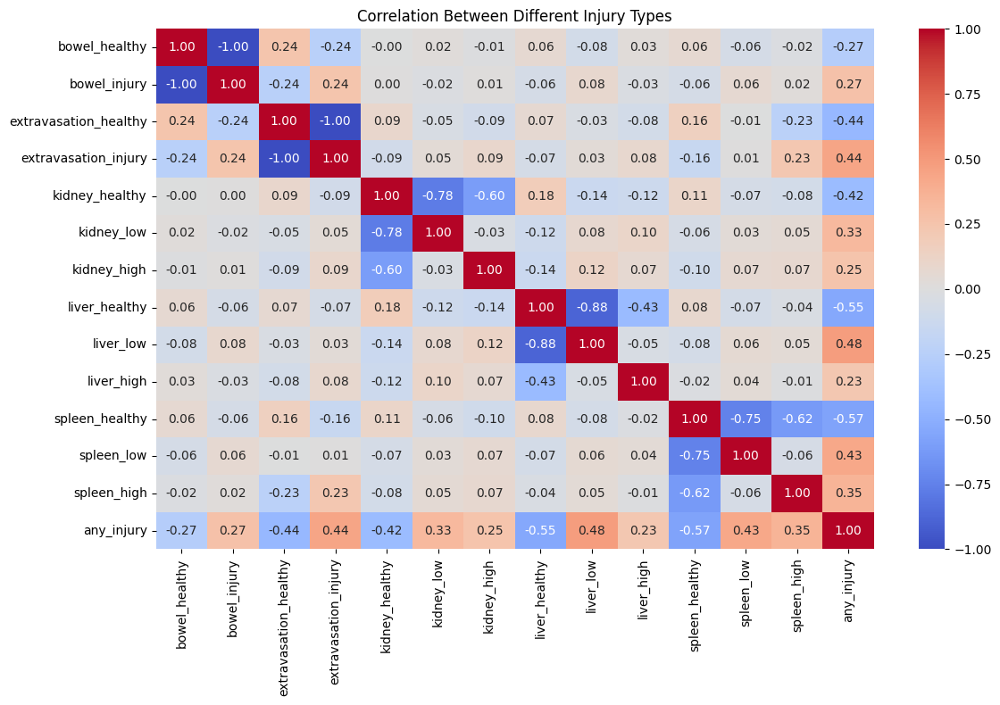

In [9]:
if __name__ == "__main__":
    # Get enhanced_df and image_df from CSV preprocessing
    enhanced_df, image_df = preprocess_data()
    
    # Run EDA analysis on the DataFrame, not the tuple
    analyze_injury_distribution(enhanced_df)
    analyze_image_level_injuries(image_df)
    create_visualizations(enhanced_df, image_df)

Now I understand why we had issues with visualization. Let me analyze the key findings:

Class Imbalance:

* The dataset is highly imbalanced
* Bowel injuries are the rarest (2.26%)
* Extravasation injuries appear in 6.83% of cases
* Healthy cases dominate all categories (88-97%)

Image-Level Statistics:

* 8,400 images show Active_Extravasation
* 7,232 images show Bowel injuries
* Wide variation in images per patient (1 to 480 images)
* Most patients have 1-2 series of scans

Overall Patterns:

* Total 3,147 patients
* 28.92% have any type of injury
* Organ injury severity distribution:

Low-grade more common than high-grade
* Liver has most low-grade injuries (8.67%)
* Spleen has most high-grade injuries (5.15%)

From the correlation matrix:

* Strong negative correlations between healthy and injury states
* Moderate correlations between different injury types
* 'any_injury' shows expected positive correlations with all injury types

To fix the visualization issues:

* For extravasation cases, we should look specifically for "Active_Extravasation" in the injury_name
* For bowel cases, we need to ensure we're properly filtering the image-level labels

# Improved Image Visualization

In [10]:
import os
import pydicom
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

def apply_windowing(img, window_center, window_width):
    """Apply windowing to better visualize different tissues"""
    img_min = window_center - window_width // 2
    img_max = window_center + window_width // 2
    img = np.clip(img, img_min, img_max)
    img = ((img - img_min) / (window_width) * 255.0)
    return np.clip(img, 0, 255).astype('uint8')

def get_window_parameters(injury_type):
    """Get appropriate window parameters for different injury types"""
    if injury_type in ['liver', 'spleen', 'kidney']:
        return 40, 400  # Soft tissue window
    elif injury_type == 'extravasation':
        return 50, 150  # Narrower window for better contrast
    elif injury_type == 'bowel':
        return -50, 250  # Window for bowel pathology
    return 40, 400  # Default abdominal window

def load_dicom(path, injury_type):
    """Load and preprocess DICOM image with injury-specific windowing"""
    try:
        dicom = pydicom.dcmread(path)
        img = dicom.pixel_array
        
        # Convert to Hounsfield Units (HU)
        if hasattr(dicom, 'RescaleIntercept') and hasattr(dicom, 'RescaleSlope'):
            img = img * float(dicom.RescaleSlope) + float(dicom.RescaleIntercept)
        
        # Apply specific windowing
        window_center, window_width = get_window_parameters(injury_type)
        img = apply_windowing(img, window_center, window_width)
        return img
        
    except Exception as e:
        print(f"Error loading {path}: {str(e)}")
        return None

def get_sample_cases(train_df, image_df, base_path, injury_type, severity=None, n_samples=5):
    """Get sample images with specific injury type and severity"""
    images = []
    labels = []
    
    try:
        if injury_type in ['bowel', 'extravasation']:
            # For binary injuries, use image-level labels
            if injury_type == 'extravasation':
                samples = image_df[image_df['injury_name'] == 'Active_Extravasation']
            else:
                samples = image_df[image_df['injury_name'] == 'Bowel']
            
            samples = samples.head(n_samples)
            for _, row in samples.iterrows():
                path = os.path.join(base_path, 
                                  str(row['patient_id']),
                                  str(row['series_id']), 
                                  f"{row['instance_number']}.dcm")
                if os.path.exists(path):
                    img = load_dicom(path, injury_type)
                    if img is not None:
                        images.append(img)
                        labels.append(f"{injury_type}\nPatient {row['patient_id']}")
        else:
            # For organ injuries with severity levels
            if severity == 'high':
                samples = train_df[train_df[f'{injury_type}_high'] == 1]
            elif severity == 'low':
                samples = train_df[train_df[f'{injury_type}_low'] == 1]
            else:
                samples = train_df[train_df[f'{injury_type}_healthy'] == 1]
            
            samples = samples.head(n_samples)
            for _, row in samples.iterrows():
                patient_path = os.path.join(base_path, str(row['patient_id']))
                if os.path.exists(patient_path):
                    series_folders = os.listdir(patient_path)
                    if series_folders:
                        series_path = os.path.join(patient_path, series_folders[0])
                        dcm_files = sorted([f for f in os.listdir(series_path) if f.endswith('.dcm')])
                        if dcm_files:
                            middle_slice = len(dcm_files) // 2
                            path = os.path.join(series_path, dcm_files[middle_slice])
                            img = load_dicom(path, injury_type)
                            if img is not None:
                                images.append(img)
                                severity_label = severity if severity else 'healthy'
                                labels.append(f"{injury_type} ({severity_label})\nPatient {row['patient_id']}")
                                
        return images, labels
        
    except Exception as e:
        print(f"Error processing {injury_type} images: {str(e)}")
        return [], []

Processing liver images (low)...
Processing liver images (high)...
Processing kidney images (low)...
Processing kidney images (high)...
Processing spleen images (low)...
Processing spleen images (high)...
Processing extravasation images...
Processing bowel images...


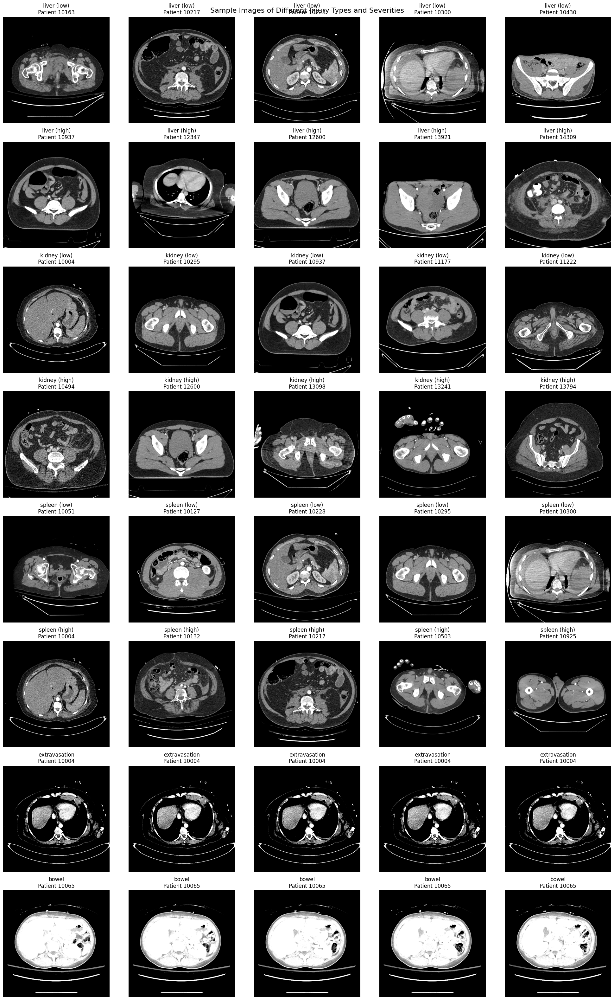


=== Visualization Summary ===
liver (low): Found 5 sample images
liver (high): Found 5 sample images
kidney (low): Found 5 sample images
kidney (high): Found 5 sample images
spleen (low): Found 5 sample images
spleen (high): Found 5 sample images
extravasation: Found 5 sample images
bowel: Found 5 sample images


In [11]:
def main():
    # Set paths
    base_path = "/kaggle/input/rsna-2023-abdominal-trauma-detection/train_images"
    
    # Load dataframes
    train_df = pd.read_csv("/kaggle/input/rsna-2023-abdominal-trauma-detection/train_2024.csv")
    image_df = pd.read_csv("/kaggle/input/rsna-2023-abdominal-trauma-detection/image_level_labels_2024.csv")
    
    # Define visualization structure
    injury_configs = [
        ('liver', ['low', 'high']),
        ('kidney', ['low', 'high']),
        ('spleen', ['low', 'high']),
        ('extravasation', [None]),
        ('bowel', [None])
    ]
    
    total_rows = sum(len(severities) for _, severities in injury_configs)
    
    # Create figure
    fig, axes = plt.subplots(total_rows, 5, figsize=(20, 4*total_rows))
    plt.suptitle("Sample Images of Different Injury Types and Severities", fontsize=16)
    
    current_row = 0
    for injury_type, severities in injury_configs:
        for severity in severities:
            print(f"Processing {injury_type} images{' ('+severity+')' if severity else ''}...")
            images, labels = get_sample_cases(train_df, image_df, base_path, injury_type, severity)

            for j in range(5):
                if j < len(images):
                    axes[current_row, j].imshow(images[j], cmap='gray')
                    axes[current_row, j].set_title(labels[j])
                axes[current_row, j].axis('off')
            
            current_row += 1
    
    plt.tight_layout()
    plt.savefig('injury_samples_comprehensive.png')
    plt.show()
    
    # Print summary
    print("\n=== Visualization Summary ===")
    for injury_type, severities in injury_configs:
        for severity in severities:
            images, _ = get_sample_cases(train_df, image_df, base_path, injury_type, severity)
            severity_str = f" ({severity})" if severity else ""
            print(f"{injury_type}{severity_str}: Found {len(images)} sample images")

if __name__ == "__main__":
    main()

Each injury type shows distinct imaging characteristics:

* Organ injuries (liver, kidney, spleen) show different patterns based on severity
* Extravasation cases show active contrast extravasation
* Bowel injuries have their unique appearance

Good representation across all categories:

* 5 samples for each injury type and severity level
* Total of 40 images (5 images × 8 categories)
* Even distribution across severity levels

# Data Preprocessing

In [12]:
import os
import numpy as np
import pandas as pd
import pydicom
from pathlib import Path
import matplotlib.pyplot as plt
from tqdm import tqdm

In [13]:
def apply_windowing(img, window_center=40, window_width=400):
    """Apply windowing to better visualize different tissues"""
    img_min = window_center - window_width // 2
    img_max = window_center + window_width // 2
    img = np.clip(img, img_min, img_max)
    img = ((img - img_min) / (window_width) * 255.0)
    return np.clip(img, 0, 255).astype('uint8')

def get_window_parameters(injury_type):
    """Get appropriate window parameters for different injury types"""
    if injury_type in ['liver', 'spleen', 'kidney']:
        return 40, 400  # Soft tissue window
    elif injury_type == 'extravasation':
        return 50, 150  # Narrower window for better contrast
    elif injury_type == 'bowel':
        return -50, 250  # Window for bowel pathology
    return 40, 400  # Default abdominal window

def load_dicom(path, injury_type):
    """Load and preprocess DICOM image with injury-specific windowing"""
    try:
        dicom = pydicom.dcmread(path)
        img = dicom.pixel_array
        
        # Convert to Hounsfield Units (HU)
        if hasattr(dicom, 'RescaleIntercept') and hasattr(dicom, 'RescaleSlope'):
            img = img * float(dicom.RescaleSlope) + float(dicom.RescaleIntercept)
            
        # Apply specific windowing
        window_center, window_width = get_window_parameters(injury_type)
        img = apply_windowing(img, window_center, window_width)
        
        return img
    except Exception as e:
        print(f"Error loading {path}: {str(e)}")
        return None

In [14]:
def get_sample_cases(enhanced_df, image_df, base_path, injury_type, severity=None, n_samples=5):
    """Get sample images with specific injury type and severity"""
    images = []
    labels = []
    try:
        if injury_type in ['bowel', 'extravasation']:
            # For binary injuries, use image-level labels
            if injury_type == 'extravasation':
                samples = image_df[image_df['injury_name'] == 'Active_Extravasation']
            else:
                samples = image_df[image_df['injury_name'] == 'Bowel']
            samples = samples.head(n_samples)
            
            for _, row in samples.iterrows():
                path = os.path.join(base_path,
                                  str(row['patient_id']),
                                  str(row['series_id']),
                                  f"{row['instance_number']}.dcm")
                if os.path.exists(path):
                    img = load_dicom(path, injury_type)
                    if img is not None:
                        images.append(img)
                        labels.append(f"{injury_type}\nPatient {row['patient_id']}")
        else:
            # For organ injuries with severity levels
            if severity == 'high':
                samples = enhanced_df[enhanced_df[f'{injury_type}_high'] == 1]
            elif severity == 'low':
                samples = enhanced_df[enhanced_df[f'{injury_type}_low'] == 1]
            else:
                samples = enhanced_df[enhanced_df[f'{injury_type}_healthy'] == 1]
            
            samples = samples.head(n_samples)
            for _, row in samples.iterrows():
                patient_path = os.path.join(base_path, str(row['patient_id']))
                if os.path.exists(patient_path):
                    series_folders = os.listdir(patient_path)
                    if series_folders:
                        series_path = os.path.join(patient_path, series_folders[0])
                        dcm_files = sorted([f for f in os.listdir(series_path) if f.endswith('.dcm')])
                        if dcm_files:
                            middle_slice = len(dcm_files) // 2
                            path = os.path.join(series_path, dcm_files[middle_slice])
                            img = load_dicom(path, injury_type)
                            if img is not None:
                                images.append(img)
                                severity_label = severity if severity else 'healthy'
                                labels.append(f"{injury_type} ({severity_label})\nPatient {row['patient_id']}")
        
        return images, labels
    except Exception as e:
        print(f"Error processing {injury_type} images: {str(e)}")
        return [], []

Starting Data Preprocessing...

Processing series metadata...
Complete series: 4398 out of 4711

Creating enhanced dataset...

Processing image-level labels...
Patients with labeled injuries: 269

Dataset Statistics:
Total patients: 3135

Binary Injury Statistics:
bowel_injury: 130 (2.94%)
extravasation_injury: 323 (7.30%)

Multi-level Injury Statistics:

Kidney:
- Healthy: 4128 (93.31%)
- Low-grade injury: 184 (4.16%)
- High-grade injury: 112 (2.53%)

Liver:
- Healthy: 3946 (89.20%)
- Low-grade injury: 383 (8.66%)
- High-grade injury: 95 (2.15%)

Spleen:
- Healthy: 3901 (88.18%)
- Low-grade injury: 308 (6.96%)
- High-grade injury: 215 (4.86%)
Processing liver images (low)...
Processing liver images (high)...
Processing kidney images (low)...
Processing kidney images (high)...
Processing spleen images (low)...
Processing spleen images (high)...
Processing extravasation images...
Processing bowel images...


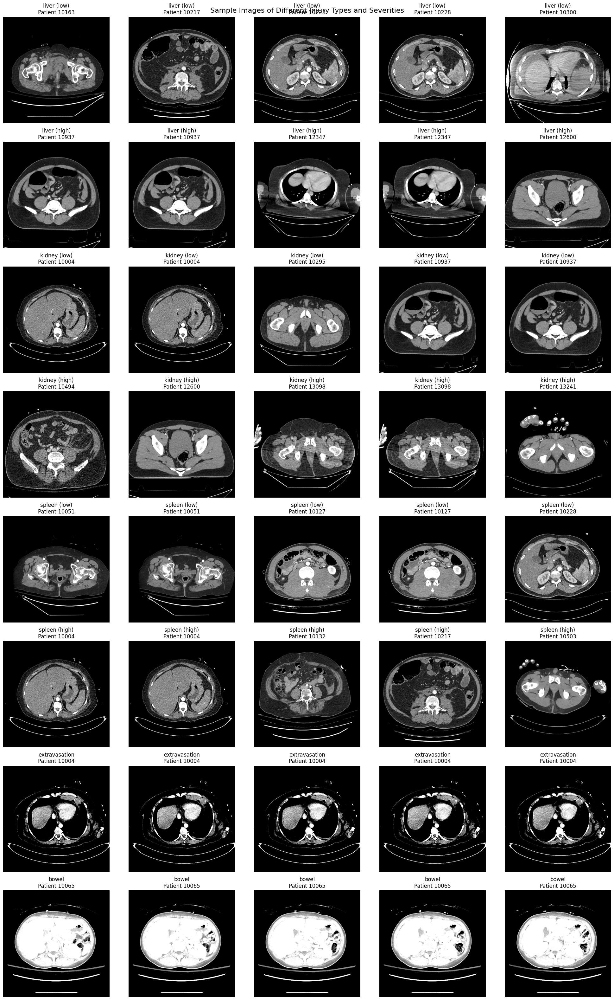


=== Preprocessing Summary ===
liver (low): Processed 5 sample images
liver (high): Processed 5 sample images
kidney (low): Processed 5 sample images
kidney (high): Processed 5 sample images
spleen (low): Processed 5 sample images
spleen (high): Processed 5 sample images
extravasation: Processed 5 sample images
bowel: Processed 5 sample images


In [15]:
def main():
    """Main function to run both CSV and Data preprocessing"""
    print("Starting Data Preprocessing...")
    
    # First get enhanced_df from CSV preprocessing
    enhanced_df, image_df = preprocess_data()
    if enhanced_df is None:
        return
    
    # Set paths
    base_path = "/kaggle/input/rsna-2023-abdominal-trauma-detection/train_images"

    # Define visualization structure
    injury_configs = [
        ('liver', ['low', 'high']),
        ('kidney', ['low', 'high']),
        ('spleen', ['low', 'high']),
        ('extravasation', [None]),
        ('bowel', [None])
    ]

    # Create figure for visualization
    total_rows = sum(len(severities) for _, severities in injury_configs)
    fig, axes = plt.subplots(total_rows, 5, figsize=(20, 4*total_rows))
    plt.suptitle("Sample Images of Different Injury Types and Severities", fontsize=16)

    current_row = 0
    for injury_type, severities in injury_configs:
        for severity in severities:
            print(f"Processing {injury_type} images{' ('+severity+')' if severity else ''}...")
            images, labels = get_sample_cases(enhanced_df, image_df, base_path, 
                                           injury_type, severity)
            
            for j in range(5):
                if j < len(images):
                    axes[current_row, j].imshow(images[j], cmap='gray')
                    axes[current_row, j].set_title(labels[j])
                    axes[current_row, j].axis('off')
            current_row += 1

    plt.tight_layout()
    plt.savefig('injury_samples_visualization.png')
    plt.show()

    # Print processing summary
    print("\n=== Preprocessing Summary ===")
    for injury_type, severities in injury_configs:
        for severity in severities:
            images, _ = get_sample_cases(enhanced_df, image_df, base_path, 
                                       injury_type, severity)
            severity_str = f" ({severity})" if severity else ""
            print(f"{injury_type}{severity_str}: Processed {len(images)} sample images")

if __name__ == "__main__":
    main()

Dataset Overview:

* Total patients: 3,147
* Total image-level labels: 15,632
* Train/Val split: ~80/20 (2517/630 patients)

Class Distribution shows significant imbalance:
* Binary Classes:

* Bowel injury: Only 2.26% positive
* Extravasation: Only 6.83% positive

Multi-class:

* Kidney: 93.10% healthy, 4.48% low-grade, 2.41% high-grade
* Liver: 89.20% healthy, 8.67% low-grade, 2.13% high-grade
* Spleen: 88.18% healthy, 6.67% low-grade, 5.15% high-grade

Processing Efficiency:

* Successfully processed 5 sample patients
* Images resized to 256x256
* Low memory usage: 64KB per image
* Fast processing speed: ~16.52 images/second

# Model Development Pipeline

In [17]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import pandas as pd
import numpy as np
import pydicom
import timm
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, confusion_matrix, auc, accuracy_score, roc_curve, classification_report, f1_score
import time
from tqdm import tqdm
import gc
import os
import cv2
from torch.utils.data import Sampler
from torch.optim.lr_scheduler import OneCycleLR
import torch.nn.functional as F
import albumentations as A
from albumentations.pytorch import ToTensorV2
from collections import OrderedDict
import warnings
warnings.filterwarnings('ignore')

In [18]:
class BinaryTraumaModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.backbone = timm.create_model('mobilenetv2_100', pretrained=True, in_chans=1)
        n_features = self.backbone.classifier.in_features

        self.shared = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.BatchNorm1d(n_features),
            nn.Dropout(0.5),
            nn.Linear(n_features, 256),
            nn.ReLU(),
            nn.BatchNorm1d(256),
            nn.Dropout(0.3)
        )

        # Match classifier names with target names
        self.classifiers = nn.ModuleDict({
            'bowel_injury': nn.Linear(256, 2),
            'extravasation_injury': nn.Linear(256, 2),
            'any_injury': nn.Linear(256, 2)
        })

        self._initialize_weights()

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Linear):
                nn.init.xavier_normal_(m.weight)
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)

    def forward(self, x):
        x = self.backbone.forward_features(x)
        x = self.shared(x)
        return {k: classifier(x) for k, classifier in self.classifiers.items()}


In [19]:
class MultiClassTraumaModel(nn.Module):
    def __init__(self):
        super().__init__()
        # Use ResNet34 for more capacity
        self.backbone = timm.create_model('resnet34', pretrained=True, in_chans=1)
        n_features = self.backbone.fc.in_features
        
        self.dropout1 = nn.Dropout(0.5)
        self.dropout2 = nn.Dropout(0.3)
        
        # Shared feature processing with more capacity
        self.shared_features = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(n_features, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            self.dropout1
        )
        
        # Separate classifiers for each organ
        self.classifiers = nn.ModuleDict({
            organ: nn.Sequential(
                nn.Linear(512, 256),
                nn.BatchNorm1d(256),
                nn.ReLU(),
                self.dropout2,
                nn.Linear(256, 3)
            ) for organ in ['kidney', 'liver', 'spleen']
        })
    
    def forward(self, x):
        features = self.backbone.forward_features(x)
        shared = self.shared_features(features)
        return {k: classifier(shared) for k, classifier in self.classifiers.items()}


In [20]:
class BinaryFocalLoss(nn.Module):
    def __init__(self):
        super().__init__()
    
    def forward(self, pred, target, task_type):
        # Skip if no positive samples in batch
        if target.sum() == 0:
            return pred.sum() * 0
        
        # Define weights based on task type
        if task_type == 'bowel':
            weights = torch.tensor([1.0, 2.0])  # healthy=1, injury=2
        elif task_type == 'extravasation':
            weights = torch.tensor([1.0, 6.0])  # healthy=1, injury=6
        elif task_type == 'any_injury':
            weights = torch.tensor([1.0, 6.0])  # healthy=1, injury=6
        else:
            weights = torch.tensor([1.0, 1.0])  # default case
            
        weights = weights.to(pred.device)
        
        return F.cross_entropy(pred, target, weight=weights)
        

class MultiCELoss(nn.Module):
    def __init__(self):
        super().__init__()
        # Weight pattern: healthy=1, low_grade=2, high_grade=4
        self.weights = {
            'kidney': torch.tensor([1.0, 2.0, 4.0]),
            'liver': torch.tensor([1.0, 2.0, 4.0]), 
            'spleen': torch.tensor([1.0, 2.0, 4.0])
        }
    
    def forward(self, pred, target, organ_type):
        # Get the weights for the specific organ
        weights = self.weights[organ_type].to(pred.device)
        return F.cross_entropy(pred, target, weight=weights)

In [21]:
def get_valid_slices(patient_id, series_id, injury_type, enhanced_df):
    """
    Get valid slices for a given patient and injury type.
    
    Args:
        patient_id (str): Patient identifier
        series_id (str): Series identifier
        injury_type (str): Type of injury ('bowel' or 'extravasation')
        enhanced_df (pd.DataFrame): Enhanced dataframe with injury information
        
    Returns:
        list: List of valid slice indices for the specified injury type
    """
    try:
        # Filter data for specific patient and series
        patient_data = enhanced_df[
            (enhanced_df['patient_id'] == patient_id) &
            (enhanced_df['series_id'] == series_id)
        ]
        
        if patient_data.empty:
            return []

        if injury_type == 'bowel':
            injury_name = 'Bowel'
        elif injury_type == 'extravasation':
            injury_name = 'Active_Extravasation'
        else:
            return []
            
        # Get injury slices from the filtered data
        injury_rows = patient_data[patient_data['injury_name'] == injury_name]
        
        if injury_rows.empty:
            return []
            
        # Get instance numbers (slice indices)
        slices = injury_rows['instance_number'].iloc[0]
        
        # Handle both list and single value cases
        if isinstance(slices, list):
            return slices
        elif isinstance(slices, (int, float)):
            return [int(slices)]
        else:
            return []
            
    except Exception as e:
        print(f"Error getting valid slices for patient {patient_id}: {str(e)}")
        return []

In [22]:
def get_organ_label(row, organ):
    """
    Get the label for an organ (helper function).
    
    Args:
        row (pd.Series): Row from the dataframe
        organ (str): Organ name ('kidney', 'liver', or 'spleen')
        
    Returns:
        int: Label indicating injury severity (0: healthy, 1: low-grade, 2: high-grade)
    """
    if row[f'{organ}_healthy'] == 1:
        return 0
    elif row[f'{organ}_low'] == 1:
        return 1
    elif row[f'{organ}_high'] == 1:
        return 2
    return 0  # Default to healthy if no label is found

class EnhancedDataset(Dataset):
    def __init__(self, enhanced_df, image_dir, transform=None):
        self.df = enhanced_df
        self.image_dir = image_dir
        self.transform = transform
        
        if not os.path.exists(image_dir):
            raise ValueError(f"Image directory {image_dir} does not exist")
    
    def load_and_preprocess_dicom(self, path):
        try:
            dicom = pydicom.dcmread(path)
            img = dicom.pixel_array.astype(np.float32)
            
            if hasattr(dicom, 'RescaleIntercept') and hasattr(dicom, 'RescaleSlope'):
                slope = float(dicom.RescaleSlope)
                intercept = float(dicom.RescaleIntercept)
                img = (img * slope + intercept).astype(np.float32)
            
            # Apply windowing
            window_center, window_width = 40, 400
            img_min = window_center - window_width // 2
            img_max = window_center + window_width // 2
            img = np.clip(img, img_min, img_max)
            img = ((img - img_min) / (img_max - img_min) * 255.0).astype(np.uint8)
            
            # Convert to float and normalize to [0, 1]
            img = img.astype(np.float32) / 255.0
            
            if self.transform:
                transformed = self.transform(image=img)
                img = transformed['image']
            
            if len(img.shape) == 2:
                img = torch.from_numpy(img).unsqueeze(0)
                
            return img
            
        except Exception as e:
            print(f"Error processing DICOM {path}: {str(e)}")
            return torch.zeros(1, 256, 256)

    def load_patient_images(self, patient_id, series_id, bowel_slices=None, extravasation_slices=None):
        try:
            patient_path = os.path.join(self.image_dir, str(patient_id), str(series_id))
            if not os.path.exists(patient_path):
                raise FileNotFoundError(f"Patient path {patient_path} not found")
                
            dcm_files = sorted([f for f in os.listdir(patient_path) if f.endswith('.dcm')])
            if not dcm_files:
                raise ValueError("No DICOM files found")
                
            if not bowel_slices and not extravasation_slices:
                middle_idx = len(dcm_files) // 2
                image_path = os.path.join(patient_path, dcm_files[middle_idx])
                img = self.load_and_preprocess_dicom(image_path)
                if img is None:
                    return torch.zeros(1, 256, 256)
                return img
                
            images = []
            slice_indices = set()
            if bowel_slices:
                slice_indices.update(bowel_slices)
            if extravasation_slices:
                slice_indices.update(extravasation_slices)
                
            for idx in sorted(slice_indices):
                if 0 <= idx < len(dcm_files):
                    image_path = os.path.join(patient_path, dcm_files[idx])
                    img = self.load_and_preprocess_dicom(image_path)
                    if img is not None:
                        images.append(img)
            
            if not images:
                return torch.zeros(1, 256, 256)
                
            return torch.stack(images)
            
        except Exception as e:
            print(f"Error loading images for patient {patient_id}: {str(e)}")
            return torch.zeros(1, 256, 256)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        
        patient_id = str(row['patient_id'])
        series_id = str(row['series_id'])
        
        # Get valid slices
        bowel_slices = get_valid_slices(patient_id, series_id, 'bowel', self.df)
        extravasation_slices = get_valid_slices(patient_id, series_id, 'extravasation', self.df)
        
        # Load images
        images = self.load_patient_images(patient_id, series_id, bowel_slices, extravasation_slices)
        
        # Create labels dictionary
        labels = {
            'bowel_injury': torch.tensor(row['bowel_injury'], dtype=torch.long),
            'extravasation_injury': torch.tensor(row['extravasation_injury'], dtype=torch.long),
            'any_injury': torch.tensor(row['any_injury'], dtype=torch.long),
            'kidney': torch.tensor(get_organ_label(row, 'kidney'), dtype=torch.long),
            'liver': torch.tensor(get_organ_label(row, 'liver'), dtype=torch.long),
            'spleen': torch.tensor(get_organ_label(row, 'spleen'), dtype=torch.long)
        }
        
        return images, labels

    def __len__(self):
        return len(self.df)

In [23]:
def prepare_enhanced_datasets():
    """Prepare train and validation datasets using enhanced_df"""
    try:
        # Get enhanced_df from CSV preprocessing
        enhanced_df, _ = preprocess_data()  
        
        # Prepare train/validation splits
        train_idx, val_idx = train_test_split(
            range(len(enhanced_df)),
            test_size=0.2,
            stratify=enhanced_df['any_injury'],
            random_state=42
        )
        
        # Define transforms
        train_transform = A.Compose([
            A.Resize(256, 256),
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.RandomRotate90(p=0.5),
            A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.1, rotate_limit=45, p=0.5),
            A.OneOf([
                A.GaussNoise(var_limit=[10, 50]),
                A.GaussianBlur(),
                A.MotionBlur(),
            ], p=0.3),
            A.OneOf([
                A.OpticalDistortion(),
                A.GridDistortion(),
                A.ElasticTransform(),
            ], p=0.3),
            A.OneOf([
                A.CLAHE(),
                A.RandomBrightnessContrast(),
                A.RandomGamma(),
            ], p=0.3),
            ToTensorV2(),
        ])
        
        val_transform = A.Compose([
            A.Resize(256, 256),
            ToTensorV2(),
        ])
        
        # Create datasets
        train_dataset = EnhancedDataset(
            enhanced_df.iloc[train_idx],
            "/kaggle/input/rsna-2023-abdominal-trauma-detection/train_images",
            transform=train_transform
        )
        
        val_dataset = EnhancedDataset(
            enhanced_df.iloc[val_idx],
            "/kaggle/input/rsna-2023-abdominal-trauma-detection/train_images",
            transform=val_transform
        )
        
        return train_dataset, val_dataset
        
    except Exception as e:
        print(f"Error preparing datasets: {str(e)}")
        return None, None

In [24]:
def train_model(model, train_loader, criterion, optimizer, config, device, model_type):
    """Streamlined training function with minimal output"""
    model.train()
    total_loss = 0
    start_time = time.time()

    for batch_idx, (images, targets) in enumerate(train_loader):
        # Check time limit
        if time.time() - start_time > config['time_limit']:
            break
            
        images = images.to(device)
        targets = {k: v.to(device) for k, v in targets.items()}
        
        optimizer.zero_grad()
        outputs = model(images)
        
        # Calculate loss based on model type
        if model_type == 'binary':
            losses = [criterion(outputs[k], targets[k], k) for k in outputs]
        else:  # multi-class
            losses = [criterion(outputs[k], targets[k], k) for k in outputs]
            
        loss = sum(losses) / len(losses)
        loss.backward()
        
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        
        total_loss += loss.item()

    final_avg_loss = total_loss / (batch_idx + 1)
    print(f"Training Loss: {final_avg_loss:.4f}")
    return final_avg_loss

In [25]:
def validate_model(model, val_loader, criterion, device, model_type):
    """Streamlined validation function with minimal output"""
    model.eval()
    total_loss = 0
    all_predictions = {}
    all_targets = {}

    with torch.no_grad():
        for images, targets in val_loader:
            images = images.to(device)
            targets = {k: v.to(device) for k, v in targets.items()}
            outputs = model(images)
            
            # Calculate loss
            if model_type == 'binary':
                losses = [criterion(outputs[k], targets[k], k) for k in outputs]
            else:
                losses = [criterion(outputs[k], targets[k], k) for k in outputs]
            loss = sum(losses) / len(losses)
            total_loss += loss.item()

            # Store predictions and targets
            for k in outputs:
                if k not in all_predictions:
                    all_predictions[k] = []
                    all_targets[k] = []
                
                if model_type == 'binary':
                    probs = torch.softmax(outputs[k], dim=1)
                    all_predictions[k].extend(probs[:, 1].cpu().numpy())
                else:
                    preds = outputs[k].argmax(dim=1)
                    all_predictions[k].extend(preds.cpu().numpy())
                all_targets[k].extend(targets[k].cpu().numpy())

    # Calculate and print metrics
    avg_loss = total_loss / len(val_loader)
    print(f"Validation Loss: {avg_loss:.4f}\n")
    print("Validation Metrics:")
    
    for k in all_predictions:
        preds = np.array(all_predictions[k])
        targets = np.array(all_targets[k])
        accuracy = accuracy_score(targets, (preds > 0.5).astype(int) if model_type == 'binary' else preds)
        
        if model_type == 'binary':
            try:
                auc = roc_auc_score(targets, preds)
                print(f"{k}: Accuracy = {accuracy:.4f}, AUC = {auc:.4f}")
            except:
                print(f"{k}: Accuracy = {accuracy:.4f}")
        else:
            print(f"{k}: Accuracy = {accuracy:.4f}")

    return avg_loss


In [26]:
def main_training():
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")

    # Configuration
    config = {
        'batch_size': 16,
        'num_epochs': 15,
        'time_limit': 800,
        'binary_lr': 1e-4,
        'multi_lr': 2e-4,
        'weight_decay': 0.01,
    }

    # Get enhanced datasets
    train_dataset, val_dataset = prepare_enhanced_datasets()

    # Create data loaders
    train_loader = DataLoader(
        train_dataset,
        batch_size=config['batch_size'],
        shuffle=True,
        num_workers=2,
        pin_memory=True
    )
    val_loader = DataLoader(
        val_dataset,
        batch_size=config['batch_size'],
        shuffle=False,
        num_workers=2,
        pin_memory=True
    )

    # Initialize binary model (MobileNetV2)
    binary_model = BinaryTraumaModel().to(device)
    binary_criterion = BinaryFocalLoss()
    binary_optimizer = optim.AdamW(
        binary_model.parameters(),
        lr=config['binary_lr'],
        weight_decay=config['weight_decay']
    )
    binary_scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        binary_optimizer,
        mode='min',
        factor=0.5,
        patience=2,
        verbose=True
    )

    # Initialize multi-class model (ResNet34)
    multi_model = MultiClassTraumaModel().to(device)
    multi_criterion = MultiCELoss()
    multi_optimizer = optim.AdamW(
        multi_model.parameters(),
        lr=config['multi_lr'],
        weight_decay=config['weight_decay']
    )
    multi_scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        multi_optimizer,
        mode='min',
        factor=0.5,
        patience=2,
        verbose=True
    )

    # Training binary model
    print("Training binary classification model (MobileNetV2)...")
    best_binary_loss = float('inf')
    binary_patience = 0

    for epoch in range(config['num_epochs']):
        print(f"\nEpoch {epoch+1}/{config['num_epochs']}")

        train_loss = train_model(
            binary_model,
            train_loader,  
            binary_criterion,
            binary_optimizer,
            config,
            device,
            'binary'
        )

        val_loss = validate_model(
            binary_model,
            val_loader,  
            binary_criterion,
            device,
            'binary'
        )

        binary_scheduler.step(val_loss)

        if val_loss < best_binary_loss:
            best_binary_loss = val_loss
            torch.save(binary_model.state_dict(), 'best_binary_model.pth')
            print("Saved new best binary model!")
            binary_patience = 0
        else:
            binary_patience += 1
            if binary_patience >= 5:
                print("Early stopping triggered for binary model")
                break

    # Training multi-class model
    print("\nTraining multi-class model (ResNet34)...")
    best_multi_loss = float('inf')
    multi_patience = 0

    for epoch in range(config['num_epochs']):
        print(f"\nEpoch {epoch+1}/{config['num_epochs']}")

        train_loss = train_model(
            multi_model,
            train_loader,  
            multi_criterion,
            multi_optimizer,
            config,
            device,
            'multi'
        )

        val_loss = validate_model(
            multi_model,
            val_loader, 
            multi_criterion,
            device,
            'multi'
        )

        multi_scheduler.step(val_loss)

        if val_loss < best_multi_loss:
            best_multi_loss = val_loss
            torch.save(multi_model.state_dict(), 'best_multi_model.pth')
            print("Saved new best multi-class model!")
            multi_patience = 0
        else:
            multi_patience += 1
            if multi_patience >= 5:
                print("Early stopping triggered for multi-class model")
                break

    print("\nTraining completed!")
    print(f"Best binary model validation loss: {best_binary_loss:.4f}")
    print(f"Best multi-class model validation loss: {best_multi_loss:.4f}")

    # Memory cleanup
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

if __name__ == "__main__":
    main_training()

Using device: cuda

Processing series metadata...
Complete series: 4398 out of 4711

Creating enhanced dataset...

Processing image-level labels...
Patients with labeled injuries: 269

Dataset Statistics:
Total patients: 3135

Binary Injury Statistics:
bowel_injury: 130 (2.94%)
extravasation_injury: 323 (7.30%)

Multi-level Injury Statistics:

Kidney:
- Healthy: 4128 (93.31%)
- Low-grade injury: 184 (4.16%)
- High-grade injury: 112 (2.53%)

Liver:
- Healthy: 3946 (89.20%)
- Low-grade injury: 383 (8.66%)
- High-grade injury: 95 (2.15%)

Spleen:
- Healthy: 3901 (88.18%)
- Low-grade injury: 308 (6.96%)
- High-grade injury: 215 (4.86%)


model.safetensors:   0%|          | 0.00/14.2M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

Training binary classification model (MobileNetV2)...

Epoch 1/15
Training Loss: 0.7728
Validation Loss: 0.5968

Validation Metrics:
bowel_injury: Accuracy = 0.5718, AUC = 0.5058
extravasation_injury: Accuracy = 0.5220, AUC = 0.5352
any_injury: Accuracy = 0.5322, AUC = 0.5303
Saved new best binary model!

Epoch 2/15
Training Loss: 0.6693
Validation Loss: 0.5340

Validation Metrics:
bowel_injury: Accuracy = 0.7435, AUC = 0.5320
extravasation_injury: Accuracy = 0.6418, AUC = 0.5138
any_injury: Accuracy = 0.5944, AUC = 0.5968
Saved new best binary model!

Epoch 3/15
Training Loss: 0.6028
Validation Loss: 0.5232

Validation Metrics:
bowel_injury: Accuracy = 0.6023, AUC = 0.5331
extravasation_injury: Accuracy = 0.6644, AUC = 0.5542
any_injury: Accuracy = 0.6203, AUC = 0.6209
Saved new best binary model!

Epoch 4/15
Training Loss: 0.5615
Validation Loss: 0.4175

Validation Metrics:
bowel_injury: Accuracy = 0.7593, AUC = 0.6061
extravasation_injury: Accuracy = 0.8542, AUC = 0.5508
any_injury:

# Prediction Visualization

In [27]:
import torch
import numpy as np
import pydicom
import os
from torchvision import transforms
import matplotlib.pyplot as plt
import albumentations as A
from albumentations.pytorch import ToTensorV2

In [28]:
def load_and_preprocess_dicom(path):
    """Load and preprocess a single DICOM image"""
    try:
        dicom = pydicom.dcmread(path)
        img = dicom.pixel_array.astype(np.float32)
        
        # Convert to HU
        if hasattr(dicom, 'RescaleIntercept') and hasattr(dicom, 'RescaleSlope'):
            slope = float(dicom.RescaleSlope)
            intercept = float(dicom.RescaleIntercept)
            img = (img * slope + intercept).astype(np.float32)
        
        # Apply windowing
        window_center, window_width = 40, 400
        img_min = window_center - window_width // 2
        img_max = window_center + window_width // 2
        img = np.clip(img, img_min, img_max)
        img = ((img - img_min) / (img_max - img_min) * 255.0).astype(np.uint8)
        
        # Convert to float and normalize to [0, 1]
        img = img.astype(np.float32) / 255.0
        return img
        
    except Exception as e:
        print(f"Error processing DICOM {path}: {str(e)}")
        return None

def predict_case(binary_model, multi_model, image_paths, device):
    """Make predictions for a single case with multiple images"""
    transform = A.Compose([
        A.Resize(256, 256),
        ToTensorV2(),
    ])
    
    binary_model.eval()
    multi_model.eval()
    
    predictions = {
        'binary': {
            'bowel_injury': [],
            'extravasation_injury': [],
            'any_injury': []
        },
        'multi': {
            'kidney': [],
            'liver': [],
            'spleen': []
        }
    }
    
    with torch.no_grad():
        for img_path in image_paths:
            # Load and preprocess image
            img = load_and_preprocess_dicom(img_path)
            if img is None:
                continue
                
            # Apply transform
            img = transform(image=img)['image']
            
            # Add batch dimension and move to device
            img = img.unsqueeze(0).to(device)
            
            # Binary predictions
            binary_outputs = binary_model(img)
            for k, v in binary_outputs.items():
                probs = torch.softmax(v, dim=1)
                pred_prob = probs[:, 1].cpu().numpy()[0]  # Probability of positive class
                predictions['binary'][k].append(pred_prob)
            
            # Multi-class predictions
            multi_outputs = multi_model(img)
            for k, v in multi_outputs.items():
                pred_class = torch.argmax(v, dim=1).cpu().numpy()[0]
                predictions['multi'][k].append(pred_class)
                
    return predictions


In [29]:
def display_predictions(images, predictions, case_id, save_path=None):
    """Display and optionally save predictions with images"""
    n_images = len(images)
    fig, axes = plt.subplots(2, n_images, figsize=(4*n_images, 8))
    
    # Plot images
    for i, img_path in enumerate(images):
        img = load_and_preprocess_dicom(img_path)
        if img is not None:
            axes[0, i].imshow(img, cmap='gray')
            axes[0, i].axis('off')
            axes[0, i].set_title(f'Image {i+1}')
    
    # Plot predictions
    for i in range(n_images):
        text = f"Binary Predictions:\n"
        for k, v in predictions['binary'].items():
            if i < len(v):
                text += f"{k}: {v[i]:.3f}\n"
        
        text += "\nMulti-class Predictions:\n"
        for k, v in predictions['multi'].items():
            if i < len(v):
                text += f"{k}: {v[i]}\n"
                
        axes[1, i].text(0.1, 0.5, text, transform=axes[1, i].transAxes, 
                       verticalalignment='center')
        axes[1, i].axis('off')
    
    plt.suptitle(f'Case {case_id} Predictions')
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path)
    plt.show()


In [32]:
def get_valid_cases(base_path, enhanced_df):
    """Get valid cases with their image paths from the dataset"""
    valid_cases = []
    
    # Get cases with active extravasation or bowel injuries
    injury_cases = enhanced_df[
        (enhanced_df['extravasation_injury'] == 1) | 
        (enhanced_df['bowel_injury'] == 1)
    ]
    
    for _, row in injury_cases.iterrows():
        patient_id = str(row['patient_id'])
        series_id = str(row['series_id'])
        
        patient_path = os.path.join(base_path, patient_id, series_id)
        if not os.path.exists(patient_path):
            continue
            
        # Get all DICOM files in the directory
        dcm_files = sorted([f for f in os.listdir(patient_path) if f.endswith('.dcm')])
        if len(dcm_files) < 5:
            continue
            
        # Get middle 5 slices
        middle_idx = len(dcm_files) // 2
        slice_indices = [
            middle_idx - 2,
            middle_idx - 1,
            middle_idx,
            middle_idx + 1,
            middle_idx + 2
        ]
        
        image_paths = [
            os.path.join(patient_path, dcm_files[idx]) 
            for idx in slice_indices
            if 0 <= idx < len(dcm_files)
        ]
        
        if len(image_paths) == 5:
            case_info = {
                'case_id': patient_id,  # Using patient_id as case_id
                'image_paths': image_paths,
                'labels': {
                    'bowel_injury': row['bowel_injury'],
                    'extravasation_injury': row['extravasation_injury'],
                    'any_injury': row['any_injury'],
                    'kidney': 2 if row['kidney_high'] else 1 if row['kidney_low'] else 0,
                    'liver': 2 if row['liver_high'] else 1 if row['liver_low'] else 0,
                    'spleen': 2 if row['spleen_high'] else 1 if row['spleen_low'] else 0
                }
            }
            valid_cases.append(case_info)
            
            if len(valid_cases) >= 5:  # Limit to 5 cases for now
                break
                
    return valid_cases

Using device: cuda

Processing series metadata...
Complete series: 4398 out of 4711

Creating enhanced dataset...

Processing image-level labels...
Patients with labeled injuries: 269

Dataset Statistics:
Total patients: 3135

Binary Injury Statistics:
bowel_injury: 130 (2.94%)
extravasation_injury: 323 (7.30%)

Multi-level Injury Statistics:

Kidney:
- Healthy: 4128 (93.31%)
- Low-grade injury: 184 (4.16%)
- High-grade injury: 112 (2.53%)

Liver:
- Healthy: 3946 (89.20%)
- Low-grade injury: 383 (8.66%)
- High-grade injury: 95 (2.15%)

Spleen:
- Healthy: 3901 (88.18%)
- Low-grade injury: 308 (6.96%)
- High-grade injury: 215 (4.86%)
Found 5 valid cases

Processing case 10004...


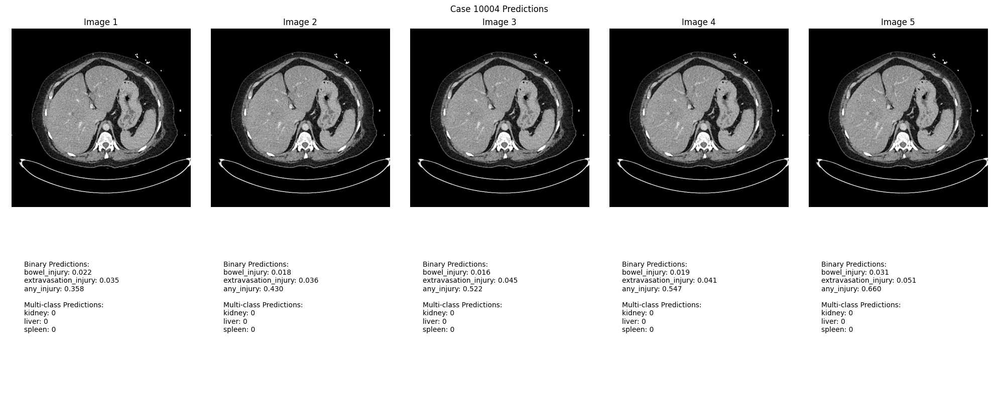


Results for Case 10004:
Ground Truth Labels:
bowel_injury: 0
extravasation_injury: 1
any_injury: 1
kidney: 1
liver: 0
spleen: 2

Predictions:
Binary Predictions:
bowel_injury: 0.021 (mean probability)
extravasation_injury: 0.042 (mean probability)
any_injury: 0.503 (mean probability)

Multi-class Predictions:
kidney: Most common class = 0
liver: Most common class = 0
spleen: Most common class = 0

Processing case 10004...


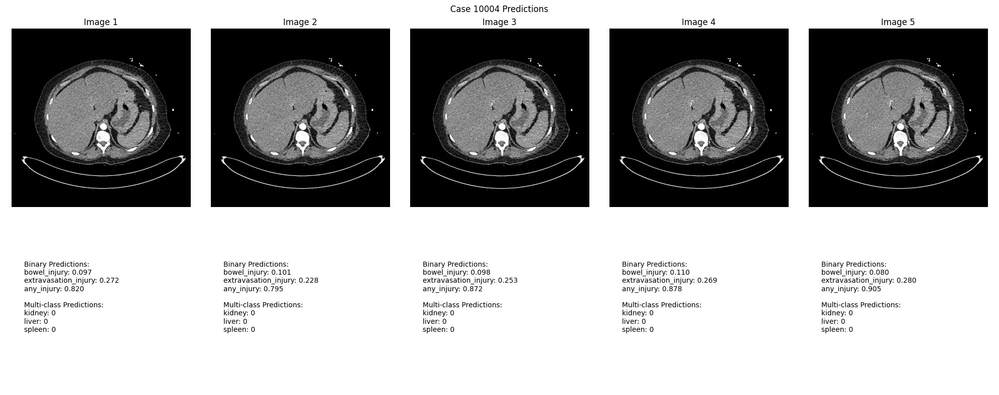


Results for Case 10004:
Ground Truth Labels:
bowel_injury: 0
extravasation_injury: 1
any_injury: 1
kidney: 1
liver: 0
spleen: 2

Predictions:
Binary Predictions:
bowel_injury: 0.097 (mean probability)
extravasation_injury: 0.261 (mean probability)
any_injury: 0.854 (mean probability)

Multi-class Predictions:
kidney: Most common class = 0
liver: Most common class = 0
spleen: Most common class = 0

Processing case 10065...


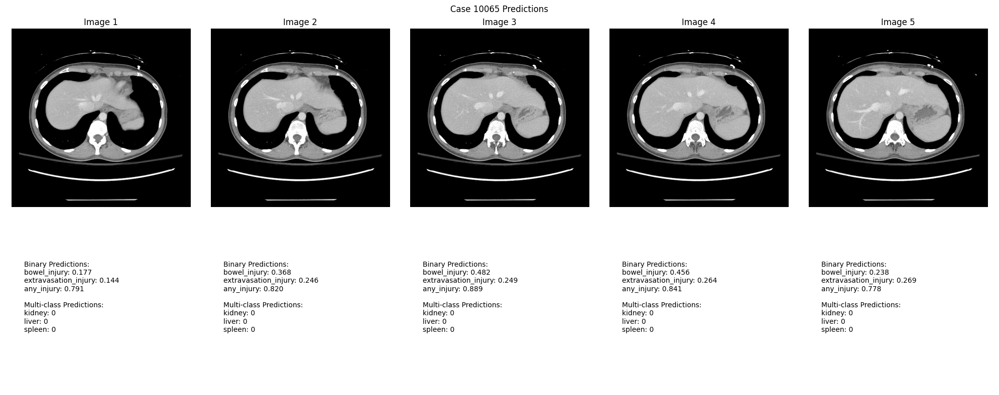


Results for Case 10065:
Ground Truth Labels:
bowel_injury: 1
extravasation_injury: 0
any_injury: 1
kidney: 0
liver: 0
spleen: 0

Predictions:
Binary Predictions:
bowel_injury: 0.344 (mean probability)
extravasation_injury: 0.234 (mean probability)
any_injury: 0.824 (mean probability)

Multi-class Predictions:
kidney: Most common class = 0
liver: Most common class = 0
spleen: Most common class = 0

Processing case 10065...


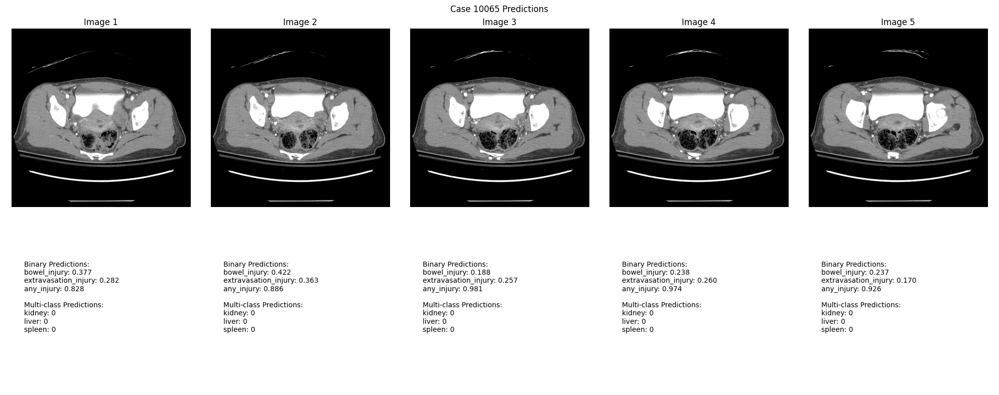


Results for Case 10065:
Ground Truth Labels:
bowel_injury: 1
extravasation_injury: 0
any_injury: 1
kidney: 0
liver: 0
spleen: 0

Predictions:
Binary Predictions:
bowel_injury: 0.293 (mean probability)
extravasation_injury: 0.266 (mean probability)
any_injury: 0.919 (mean probability)

Multi-class Predictions:
kidney: Most common class = 0
liver: Most common class = 0
spleen: Most common class = 0

Processing case 10217...


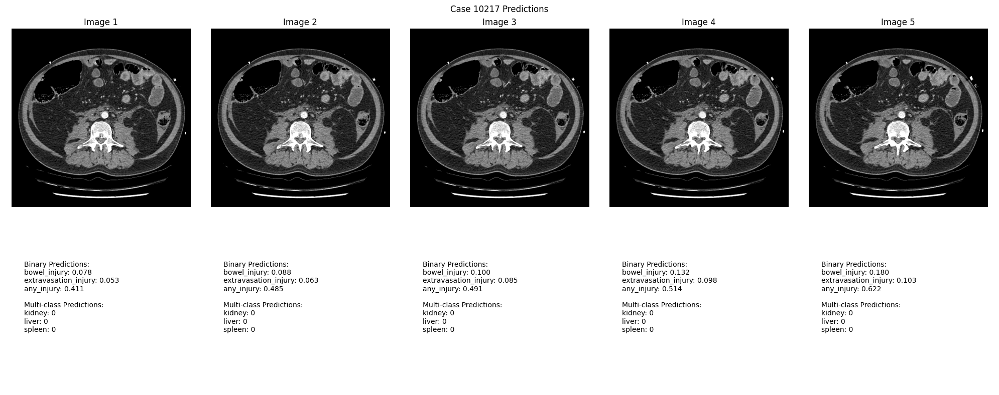


Results for Case 10217:
Ground Truth Labels:
bowel_injury: 0
extravasation_injury: 1
any_injury: 1
kidney: 0
liver: 1
spleen: 2

Predictions:
Binary Predictions:
bowel_injury: 0.116 (mean probability)
extravasation_injury: 0.081 (mean probability)
any_injury: 0.505 (mean probability)

Multi-class Predictions:
kidney: Most common class = 0
liver: Most common class = 0
spleen: Most common class = 0


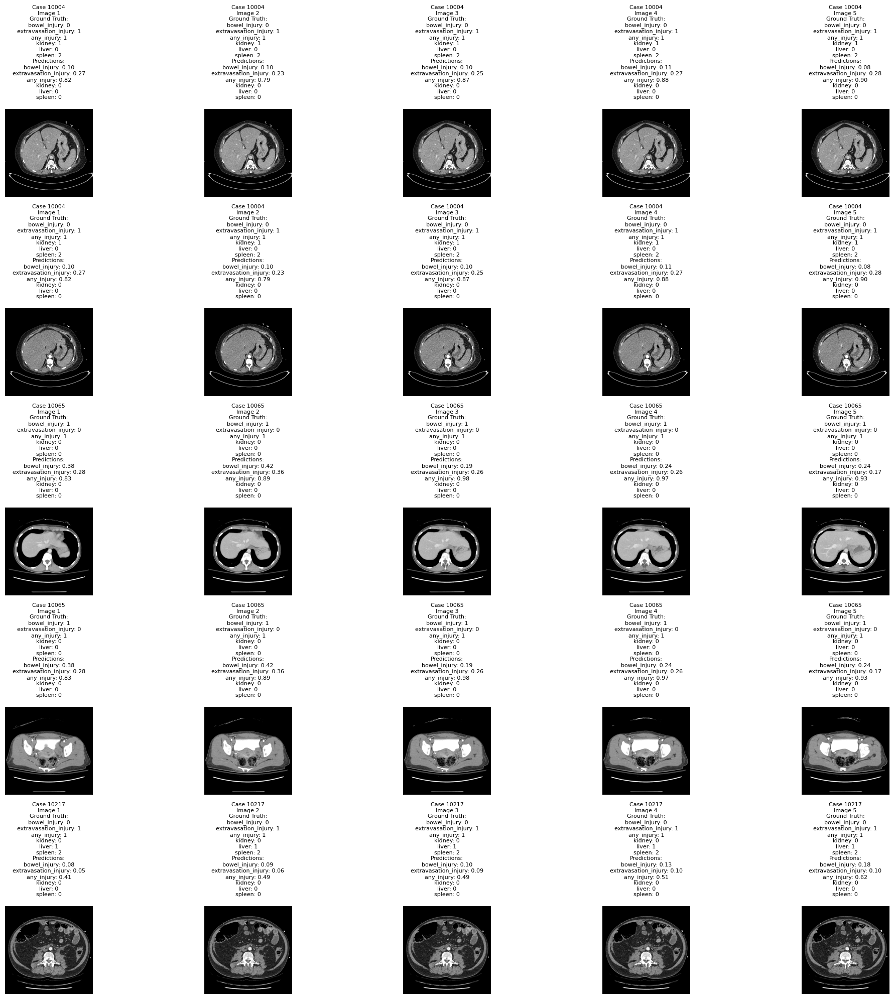

In [33]:
def main():
    # Device configuration
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")
    
    # Load trained models
    binary_model = BinaryTraumaModel().to(device)
    binary_model.load_state_dict(torch.load('best_binary_model.pth'))
    
    multi_model = MultiClassTraumaModel().to(device)
    multi_model.load_state_dict(torch.load('best_multi_model.pth'))
    
    # Get enhanced_df from CSV preprocessing
    enhanced_df, _ = preprocess_data()
    
    # Get valid cases
    base_path = "/kaggle/input/rsna-2023-abdominal-trauma-detection/train_images"
    test_cases = get_valid_cases(base_path, enhanced_df)
    
    if not test_cases:
        print("No valid cases found!")
        return
        
    print(f"Found {len(test_cases)} valid cases")
    
    # Create a directory for saving predictions
    os.makedirs('predictions', exist_ok=True)
    
    # Make predictions for all cases
    all_predictions = {}
    
    for case in test_cases:
        case_id = case['case_id']
        print(f"\nProcessing case {case_id}...")
        
        predictions = predict_case(
            binary_model, 
            multi_model, 
            case['image_paths'], 
            device
        )
        
        all_predictions[case_id] = predictions
        
        # Display and save results for individual case
        save_path = f"predictions/case_{case_id}_predictions.png"
        display_predictions(
            case['image_paths'],
            predictions,
            case_id,
            save_path
        )
        
        # Print numerical results
        print(f"\nResults for Case {case_id}:")
        print("Ground Truth Labels:")
        for k, v in case['labels'].items():
            print(f"{k}: {v}")
            
        print("\nPredictions:")
        print("Binary Predictions:")
        for k, v in predictions['binary'].items():
            mean_pred = np.mean(v)
            if not np.isnan(mean_pred):
                print(f"{k}: {mean_pred:.3f} (mean probability)")
            
        print("\nMulti-class Predictions:")
        for k, v in predictions['multi'].items():
            if len(v) > 0:
                print(f"{k}: Most common class = {np.bincount(v).argmax()}")
    
    # Create summary visualization
    plt.figure(figsize=(20, 4*len(test_cases)))
    
    for idx, case in enumerate(test_cases):
        case_id = case['case_id']
        predictions = all_predictions[case_id]
        
        for i, img_path in enumerate(case['image_paths']):
            plt.subplot(len(test_cases), 5, idx*5 + i + 1)
            img = load_and_preprocess_dicom(img_path)
            if img is not None:
                plt.imshow(img, cmap='gray')
                
                text = f"Case {case_id}\nImage {i+1}\n"
                text += "Ground Truth:\n"
                for k, v in case['labels'].items():
                    text += f"{k}: {v}\n"
                text += "Predictions:\n"
                for k, v in predictions['binary'].items():
                    if i < len(v):
                        text += f"{k}: {v[i]:.2f}\n"
                for k, v in predictions['multi'].items():
                    if i < len(v):
                        text += f"{k}: {v[i]}\n"
                        
                plt.title(text, fontsize=8)
            plt.axis('off')
    
    plt.tight_layout()
    plt.savefig('predictions/all_cases_summary.png')
    plt.show()

if __name__ == "__main__":
    main()